# Image Segmentation and Filter

This notebook will use [DeepLab2](https://github.com/google-research/deeplab2) model for image segmentation.

The checkpoints used in this notebook are pretrained on the COCO dataset.

### Import library

In [1]:
import os
import tempfile

import numpy as np
from PIL import Image, ImageFilter, ImageOps
import urllib

import tensorflow as tf

### Download and load model

In [2]:
MODEL_NAME = 'resnet50_kmax_deeplab_coco_train'

_DOWNLOAD_URL_PATTERN = f'https://storage.googleapis.com/gresearch/tf-deeplab/saved_model/{MODEL_NAME}.tar.gz'

MODEL_URL = _DOWNLOAD_URL_PATTERN

In [3]:
model_dir = tempfile.mkdtemp()

download_path = os.path.join(model_dir, MODEL_NAME + '.gz')
urllib.request.urlretrieve(MODEL_URL, download_path)

!tar -xzvf {download_path} -C {model_dir}

model = tf.saved_model.load(os.path.join(model_dir, MODEL_NAME))

./resnet50_kmax_deeplab_coco_train/
./resnet50_kmax_deeplab_coco_train/assets/
./resnet50_kmax_deeplab_coco_train/saved_model.pb
./resnet50_kmax_deeplab_coco_train/variables/
./resnet50_kmax_deeplab_coco_train/variables/variables.index
./resnet50_kmax_deeplab_coco_train/variables/variables.data-00000-of-00001


### Run on sample images

In [4]:
def filter_image(img_path, blur=True, blur_radius=5, grayscale=False, get_mask=False, save=False):
    image = Image.open(img_path)
    edited_image = Image.open(img_path)
    output = model(tf.cast(image, tf.uint8))
    mask = np.equal(output['semantic_pred'][0], 1) # 1 is the number for person
    mask_image = Image.fromarray(mask)

    if blur:
        edited_image = edited_image.filter(ImageFilter.BoxBlur(radius=blur_radius))

    if grayscale:
        edited_image = ImageOps.grayscale(edited_image)

    result = Image.composite(image, edited_image.convert('RGB'), mask_image)

    if save:
        result.save('result_' + img_path)
        mask_image.save('mask_' + img_path)

    if get_mask:
        return result, mask_image

    return result

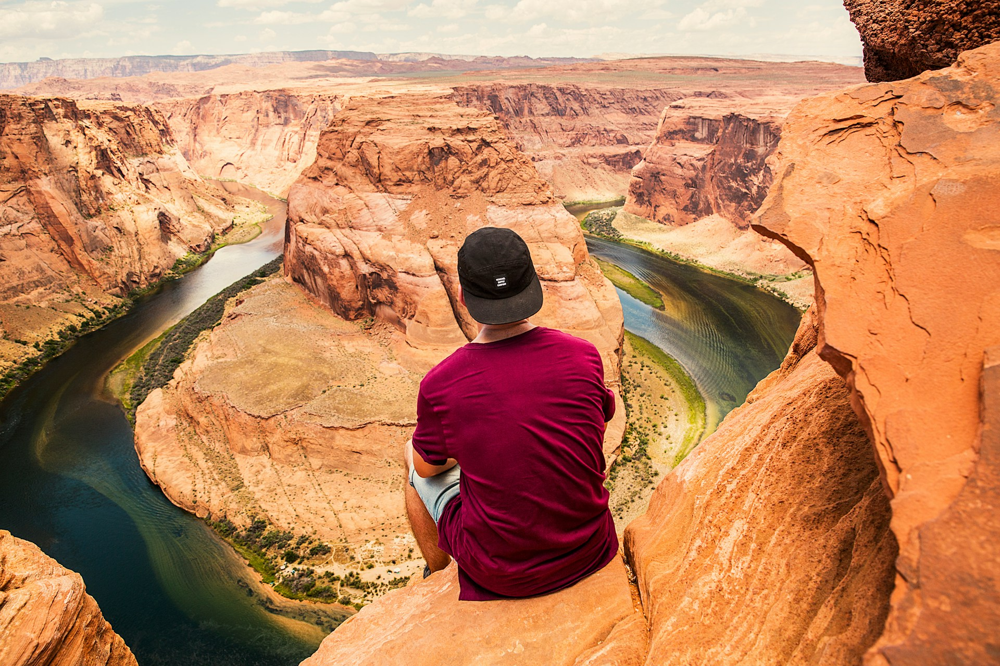

In [5]:
image = Image.open("image.jpg")
image

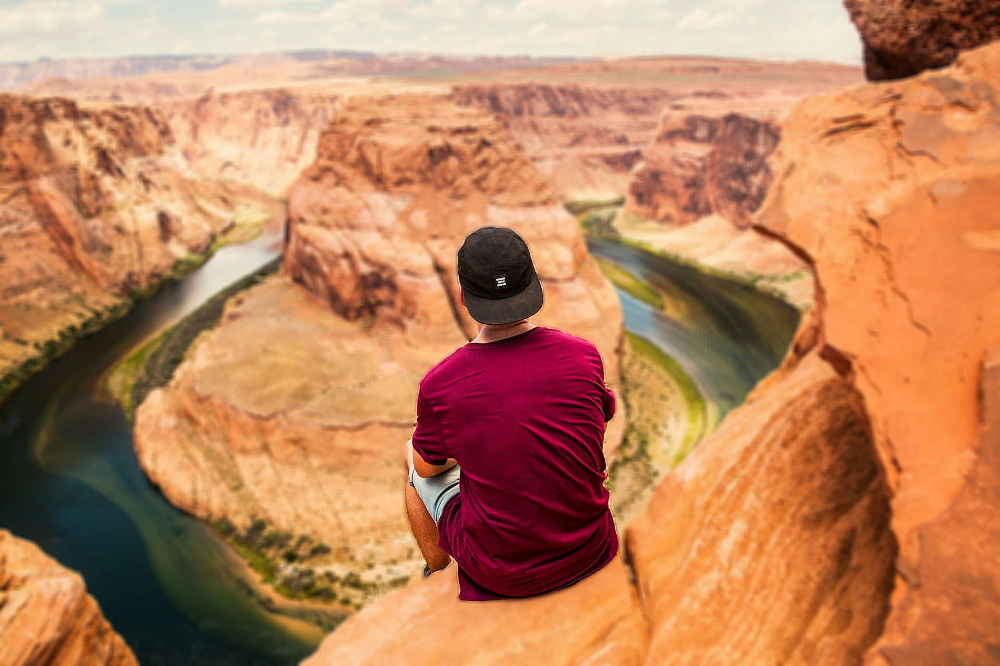

In [6]:
# Blur
result1 = filter_image('image.jpg')
result1

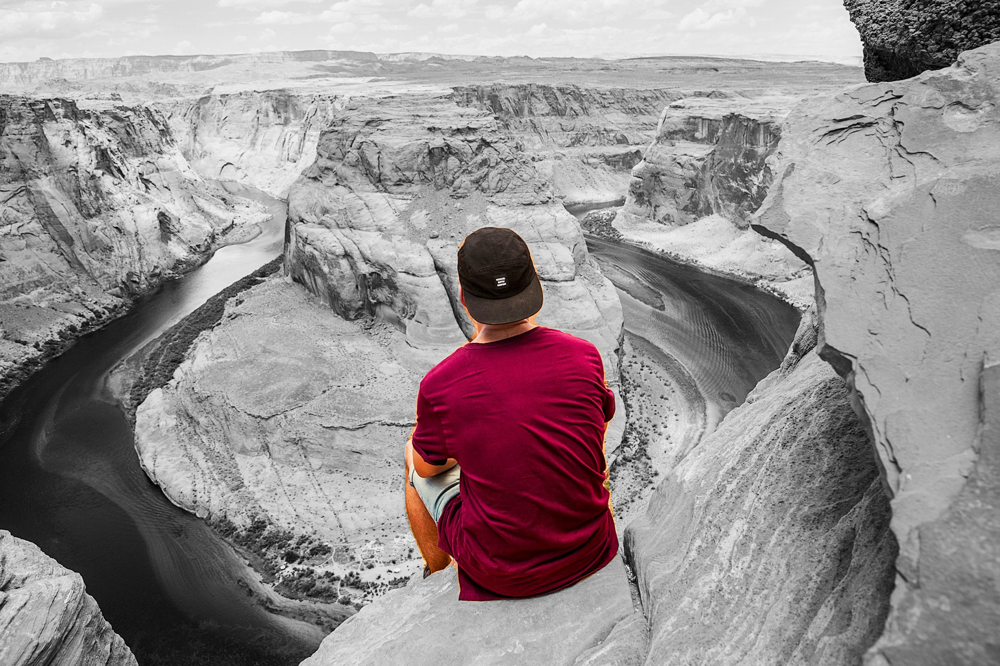

In [7]:
# Grayscale
result2 = filter_image('image.jpg', blur=False, grayscale=True)
result2

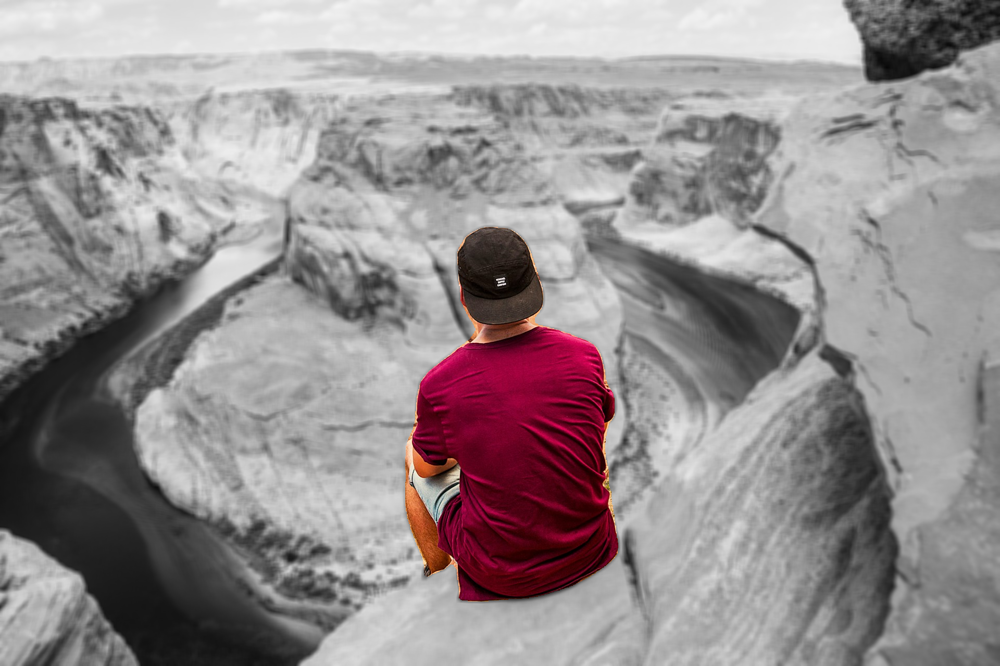

In [8]:
# Blur and grayscale
result3 = filter_image('image.jpg', blur=True, grayscale=True)
result3

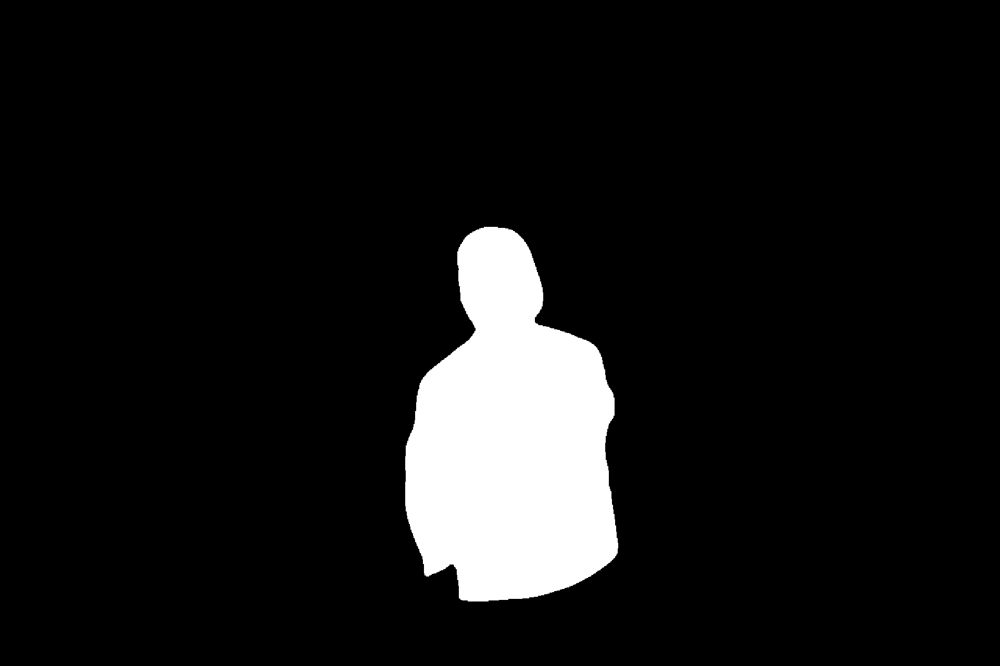

In [9]:
# Mask
_, mask = filter_image('image.jpg', get_mask=True)
mask

In [10]:
# Save images
result = filter_image('image.jpg', save=True)